# Coin Metrics Prices Case Study

**Author:** Coin Metrics  
**Date:** 2023-07-03 (migrated to Python on 2025-07-25)  
**Subtitle:** Pricing methodologies analysis and performance during market stress

**Instructions:** Provide your API key in the Google Secrets to the left

In [1]:
%pip install coinmetrics-api-client -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.0/52.0 kB 657.1 kB/s eta 0:00:00


In [41]:
# Setup and imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import requests
from datetime import datetime, timedelta
import warnings
import os
from google.colab import userdata
from coinmetrics.api_client import CoinMetricsClient
import matplotlib.dates as mdates

api_key = userdata.get('api_key')
client = CoinMetricsClient(api_key)

warnings.filterwarnings('ignore')

# Set plotting style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")
plt.rcParams['figure.figsize'] = (12, 6)
plt.rcParams['figure.dpi'] = 300

In [3]:
# Configuration variables
whitelisted_exchanges = [
    "Coinbase",
    "Bitstamp",
    "Bittrex",
    "itBit",
    "Kraken",
    "Binance.US",
    "Gemini"
]

constituent_markets = [
    "coinbase-eth-usd-spot",
    "bitstamp-eth-usd-spot",
    "bittrex-eth-usd-spot",
    "itbit-eth-usd-spot",
    "kraken-eth-usd-spot",
    "binance.us-eth-usd-spot",
    "gemini-eth-usd-spot"
]


Start time: 2021-02-22T13:00:00Z
End time: 2021-02-22T14:40:00Z


In [25]:
# Helper functions for API calls
def get_coinmetrics_api_v4_market_trades(markets, start_time, end_time, page_size=10000):
    """
    Fetch market trades data from Coin Metrics API
    """

    params = {
        'markets': markets,
        'start_time': start_time,
        'end_time': end_time,
        'page_size': page_size
    }

    return client.get_market_trades(**params).parallel().to_dataframe()

def get_coinmetrics_api_v4_asset_metrics(assets, metric, frequency, start_time, end_time, page_size=10000):
    """
    Fetch asset metrics data from Coin Metrics API
    """
    params = {
        'assets': assets,
        'metrics': metric,
        'frequency': frequency,
        'start_time': start_time,
        'end_time': end_time,
        'page_size': page_size
    }
    if frequency == "1s":
      return client.get_asset_metrics(**params).parallel(time_increment=timedelta(minutes=10)).to_dataframe()
    else:
      return client.get_asset_metrics(**params).parallel(time_increment=timedelta(hours=1)).to_dataframe()

def get_coinmetrics_api_v4_index_levels(indexes, frequency, start_time, end_time, page_size=10000):
    """
    Fetch index levels data from Coin Metrics API
    """
    params = {
        'indexes': indexes,
        'frequency': frequency,
        'start_time': start_time,
        'end_time': end_time,
        'page_size': page_size
    }

    return client.get_index_levels(**params).to_dataframe()

print("API helper functions loaded")

API helper functions loaded


In [44]:
def generate_case_study_plots(event_time, asset="btc", title="Case Study", window_1s=2, window_1h=12):
    """
    Generate case study plots for a given event time and asset

    Parameters:
    event_time: str - The event time in format 'YYYY-MM-DD HH:MM:SS'
    asset: str - Asset symbol ('btc' or 'eth')
    title: str - Title for the plots
    window_1s: int - Hours window for 1-second plots
    window_1h: int - Hours window for 1-hour plots

    Returns:
    dict - Dictionary containing different plot figures
    """

    if asset == "btc":
        asset_name = "Bitcoin"
        markets = [
            "coinbase-btc-usd-spot",
            "gemini-btc-usd-spot",
            "kraken-btc-usd-spot",
            "binance.us-btc-usd-spot",
            "itbit-btc-usd-spot",
            "bittrex-btc-usd-spot",
            "bitstamp-btc-usd-spot"
        ]
        index = "CMBIBTC"
    elif asset == "eth":
        asset_name = "Ethereum"
        markets = [
            "coinbase-eth-usd-spot",
            "gemini-eth-usd-spot",
            "kraken-eth-usd-spot",
            "binance.us-eth-usd-spot",
            "itbit-eth-usd-spot",
            "bittrex-eth-usd-spot",
            "bitstamp-eth-usd-spot"
        ]
        index = "CMBIETH"

    # Set times - make timezone-aware
    event_time_dt = pd.to_datetime(event_time, utc=True)
    event_date = event_time_dt.strftime("%B %d, %Y")

    start_time_formatted = (event_time_dt - timedelta(hours=12)).strftime("%Y-%m-%dT%H:%M:%SZ")
    end_time_formatted = (event_time_dt + timedelta(hours=12)).strftime("%Y-%m-%dT%H:%M:%SZ")

    # Get data
    print(f"Fetching trades data for {asset_name} case study...")

    coinmetrics_trades_data = get_coinmetrics_api_v4_market_trades(
        markets=",".join(markets),
        start_time=start_time_formatted,
        end_time=end_time_formatted
    )

    print(f"Fetching hourly reference rate for {asset_name} case study...")
    coinmetrics_reference_rate_1h = get_coinmetrics_api_v4_asset_metrics(
        assets=asset,
        metric="ReferenceRate",
        frequency="1h",
        start_time=start_time_formatted,
        end_time=end_time_formatted
    )

    print(f"Fetching second-by-second reference rate for {asset_name} case study...")
    coinmetrics_reference_rate_1s = get_coinmetrics_api_v4_asset_metrics(
        assets=asset,
        metric="ReferenceRate",
        frequency="1s",
        start_time=start_time_formatted,
        end_time=end_time_formatted
    )

    # Create plots dictionary
    plots = {}

    # Helper function to create plot
    def create_plot(df_trades, df_reference, reference_col, plot_title, subtitle):
        fig, ax = plt.subplots(figsize=(12, 6))

        # Plot trades as scatter points
        for market in df_trades['market'].unique():
            market_data = df_trades[df_trades['market'] == market]
            ax.scatter(market_data['time'], market_data['price'],
                      s=market_data['amount']*0.1, alpha=0.6, label=market)

        # Plot reference rate as line
        if not df_reference.empty:
            ax.plot(df_reference['time'], df_reference[reference_col],
                   color='black', linewidth=2, label='Reference Rate')

        # Format x-axis to show only HH:MM
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
        ax.xaxis.set_major_locator(mdates.HourLocator(interval=2))  # Show every hour

        # Rotate labels for better readability
        #plt.setp(ax.xaxis.get_majorticklabels(), rotation=45)

        ax.set_xlabel('')
        ax.set_ylabel('Price (USD)')
        ax.set_title(f"{plot_title} on {event_date}")
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()

        return fig

    # Generate plots if data is available
    if not coinmetrics_trades_data.empty:
        # Filter data for different time windows
        trades_1s = coinmetrics_trades_data[
            (coinmetrics_trades_data['time'] >= event_time_dt - timedelta(hours=window_1s)) &
            (coinmetrics_trades_data['time'] <= event_time_dt + timedelta(hours=window_1s))
        ]

        trades_1h = coinmetrics_trades_data[
            (coinmetrics_trades_data['time'] >= event_time_dt - timedelta(hours=window_1h)) &
            (coinmetrics_trades_data['time'] <= event_time_dt + timedelta(hours=window_1h))
        ]

        # Reference Rate 1s plot
        if not coinmetrics_reference_rate_1s.empty:
            ref_1s_filtered = coinmetrics_reference_rate_1s[
                (coinmetrics_reference_rate_1s['time'] >= event_time_dt - timedelta(hours=window_1s)) &
                (coinmetrics_reference_rate_1s['time'] <= event_time_dt + timedelta(hours=window_1s))
            ]
            plots['ReferenceRate_1s'] = create_plot(
                trades_1s, ref_1s_filtered, 'ReferenceRate',
                title, f"{asset_name} Real-Time Reference Rate is shown in black, trades from exchanges shown in color."
            )

        # Reference Rate 1h plot
        if not coinmetrics_reference_rate_1h.empty:
            ref_1h_filtered = coinmetrics_reference_rate_1h[
                (coinmetrics_reference_rate_1h['time'] >= event_time_dt - timedelta(hours=window_1h)) &
                (coinmetrics_reference_rate_1h['time'] <= event_time_dt + timedelta(hours=window_1h))
            ]
            plots['ReferenceRate_1h'] = create_plot(
                trades_1h, ref_1h_filtered, 'ReferenceRate',
                title, f"{asset_name} Hourly Reference Rate is shown in black, trades from exchanges shown in color."
            )

    return plots

print("Case study plot function loaded")

Case study plot function loaded


# Abstract

The pricing methodologies for the Coin Metrics Reference Rates (the "Reference Rates") and the Coin Metrics Bletchley Indexes (the "Indexes") were developed after an comprehensive review of existing pricing and reference rate methodologies across multiple asset classes. Extensive backtesting during times of market stress representing a wide range of market conditions and across multiple cryptoassets was also conducted. In this article, we discuss the reasoning behind some key methodology design choices and illustrate how our methodology perform during a period of market stress.

# Methodology Discussion

Here we discuss several of our key methodology design choices and the prior precedent supporting these choices. We often receive questions on the hierarchy of data inputs in the calculation of prices as well as whether prices should be derived using volume-weighted average or volume-weighted median techniques -- both of these questions are discussed below. This section is written assuming the reader has general familiarity with our [Coin Metrics Prices Policies](https://docs.coinmetrics.io/market-data/methodologies/coin-metrics-prices-policies) and [Coin Metrics Prices Methodology](https://docs.coinmetrics.io/market-data/methodologies/coin-metrics-prices-methodology).

## Transactional Data or Order Book Data

The data inputs for the calculation of the Reference Rates and Indexes are observable transactions in an active market where the given cryptocurrency is traded. For each unique asset or index, a unique set of constituent markets are selected using our [Market Selection Framework](https://docs.coinmetrics.io/market-data/methodologies/coin-metrics-prices-methodology#data-inputs), a systematic method of scoring markets across 36 qualitative and quantitative factors. While data inputs sourced from order book data were considered, we selected observable transactions after reviewing the International Organization of Securities Commissions' (IOSCO) [Principles for Financial Benchmarks](https://www.iosco.org/library/pubdocs/pdf/IOSCOPD415.pdf) (the "Principles"), a set of recommended practices for administrators of financial benchmarks. Since their publication in 2013, these recommendations have been adopted by most major reference rate and index administrators.

The Principles state the following regarding data sufficiency and what data should be used to construct a benchmark:

> The data used to construct a Benchmark should be based on prices, rates, indices or values that have been formed by the competitive forces of supply and demand (i.e., in an active market) and be anchored by observable transactions entered into at arm's length between buyers and sellers in the market for the Interest the Benchmark measures. This Principle recognizes that Bona Fide observable transactions in active markets provide a level of confidence that the prices or values used as the basis of the Benchmark are credible.

Our interpretation of their recommendation indicates that observable transactions (i.e. trades data) are preferable to order book data in calculating prices, provided that transaction volume is high over sustained periods. That being said, the Principles do allow for administrators to construct benchmarks to be constructed on other forms of data that are tied to observable transactions as an adjunct or supplement to transactions if an adequate reason exists. We are actively researching whether order book data could serve as a supplement or replacement to observable transactions in connection with our Reference Rates and Indexes in less liquid assets.

The second reason for choosing observable transactions rather than order book data is related to the ability to audit, reproduce, and backfill historical values. All cryptocurrency exchanges allow users to query trades data. Every individual trade is timestamped and is associated with a unique trade identifier. Most exchanges allow users to query all historical trades from the inception of the exchange while other exchanges allow users to query trades over a recent window. These qualities allow for prices generated from trades data to be uniquely auditable and reproducible because trades data serve as a single source of truth available to all market participants. Additionally, by using historical trades, historical values can be backfilled. For instance, our Bitcoin reference rates and the CMBI BItcoin Index begin on July 2010 allowing us to provide over 10 years of history.

In contrast, an extremely limited number of exchanges allow users to query historical order book data. The vast majority of exchanges do not allow users to query historical order book data. For certain exchanges, exchange-reported timestamps are not available for order book data. This means that market participants must rely on the timestamp at which they received the data which can vary based on the geographic location of various users and the lack of synchronized clocks. In addition, some exchanges do not associate a unique order book identifier with order book snapshots or updates leading to the inability to definitively compare data that is collected from different systems. These qualities result in the lack of a single source of truth available to all market participants. While prices generated from order book data may be more timely, they are not auditable or reproducible, and historical values are impossible to backfill.

Furthermore, prices derived from order book data are not robust to any interruptions in the collection of the data, either due to instability in the systems of the index administrator, general internet disruptions as a result of instability of a large cloud hosting provider or content delivery network, or instability in the systems of the exchange. Such interruptions are common and are to be expected, especially during times of high trading activity and market stress. In a worst case scenario, the collection of data could be interrupted during the window that a settlement or closing price is to be calculated. Under these circumstances, it would be impossible for a pricing methodology derived from order book to calculate the price while a pricing methodology derived from trades would be able to after system instability is resolved. It is prudent to construct a pricing methodoogy derived from trades rather than order book for this reason alone. Coin Metrics utilizes multiple instances of both real-time and historical trade scrapers which are connected to an exchange's HTTP and websocket API for redundancy purposes to ensure a resilient stream of trades data collection.

Our decision to use trades data in our pricing methodologies is consistent with the decisions made by the following financial benchmark administrators:

1. Crypto Facilities which administers the [CME CF Reference Rates](https://www.cmegroup.com/trading/cryptocurrency-indices/cf-bitcoin-reference-rate.html) which are used as the settlement price for CME Bitcoin and Ethereum futures. The methodology uses relevant transactions from a set of constituent exchanges.

2. ICE Benchmark Administration Limited which administers the [ICE LIBOR](https://www.theice.com/iba/libor), a widely used benchmark for short-term bank borrowing rates. The methodology uses a hierarchy of data inputs which utilizes a standrized, transaction data-drive waterfall methodology. The methodology uses panel banks' unsecured wholesale transactions to the greatest extent possible. If such data is insufficient, the methodology then considers historical transactions adjusted for market movements. If neither of these two data sources are insufficient, expert judgment is used.

3. The Federal Reserve Bank of New York (the "New York Fed") which administers for the [Effective Federal Funds Rate (EFFR), the Overnight Bank Funding Rate (OBFR), the Secured Overnight Financing Rate (SOFR)](https://www.newyorkfed.org/markets/reference-rates), and several other rates. The New York Fed uses daily transaction data on overnight federal funds transactions provided by domestic and foreign banks as well as certain overnight Eurodollar transaction data.

4. Bitwise Asset Management which offers the [Bitwise 10 Crypto Index Fund, Bitwise DeFi Crypto Index Fund, Bitwise Bitcoin Fund](https://www.bitwiseinvestments.com/), and several others. In connection with a [filing with the SEC seeking approval to launch a Bitcoin ETF](https://www.sec.gov/comments/sr-nysearca-2019-01/srnysearca201901-5164833-183434.pdf), Bitwise proposed a methodology to calculate the net asset value of the fund. This methodology utilizes prices from transaction data from a large number of exchanges.

5. Bloomberg which administers the [Bloomberg BFIX](https://data.bloomberglp.com/notices/sites/3/2016/04/bfix_methodology.pdf), a series of foreign exchange rates for certain currencies and metals. The methodology uses a hierachy of data inputs where executed prices are preferred to executable prices.

6. Reuters which adminsiters the [WM/Refinitiv FX Benchmarks](https://www.refinitiv.com/content/dam/marketing/en_us/documents/methodology/wm-refinitiv-methodology.pdf), a series of foreign exchange rates for certain currencies. The methodology also uses a hierachy of data inputs consisting of traded rates or order rates, with traded rates taking precedence.

## Volume-Weighted Average or Volume-Weighted Median

Calculating prices using a volume-weighted average or a volume-weighted median are logical choices because both the average and median are measures of central tendency. A volume-weighted average price is calculated by summing the volume traded at a given price divided by the total volume of all transactions. A volume-weighted median price is calculated by ordering the transactions from lowest to highest price, taking the cumulative sum of volumes of these transactions, and identifying the price associated with the trades at the 50th percentile of volume.

Our decision to use a volume-weighted median, as opposed to a volume-weighted average, in our pricing methodologies was influenced by a technical note from the New York Fed. The New York Fed produces a set of reference rates related to money markets, including the Effective Federal Funds Rate (EFFR). Prior to 2015, this rate was calculated using a volume-weighted average. However, the methodology was reviewed to determine if the rate could be made more robust to conditions in the federal funds market. This review concluded that switching from a volume-weighted average to a volume-weighted median would enhance the resilience, reliability, and integrity of the EFFR. Among their findings, they determined that a volume-weighted median is the same or very close to the volume-weighted average at most times and that the volume-weighted median is the more appropriate rate during times that the two measures differed. The reasons behind this change were communicated in [Technical Note Concerning the Methodology for Calculating the Effective Federal Funds Rate](https://www.newyorkfed.org/medialibrary/media/markets/EFFR-technical-note-070815.pdf).

The New York Fed's conclusions were confirmed from our own backtesting of various pricing methodologies across times of market stress. Despite rising volumes, the entrance of several institutional market participants, and years of investment in improving trading infrastructure, pricing anomalies are regularly observed in cryptoasset markets -- even in the most liquid ones. Here we present a recent example of a flash crash in Kraken's ETH-USD market on February 22, 2021.

In [52]:
start_time = "2021-02-22T13:00:00"
end_time = "2021-02-22T14:40:00"


# Fetch and process trades data for the flash crash example
print("Fetching ETH trades data for flash crash analysis...")

coinmetrics_trades_data = get_coinmetrics_api_v4_market_trades(
    markets=",".join(constituent_markets),
    start_time=start_time,
    end_time=end_time
)

coinmetrics_rtrr_data = get_coinmetrics_api_v4_asset_metrics(
    assets="eth",
    metric="ReferenceRateUSD",
    frequency="1s",
    start_time=start_time,
    end_time=end_time
)

if not coinmetrics_trades_data.empty:
    # Process trades data
    coinmetrics_trades_data['time_second'] = coinmetrics_trades_data['time'].dt.ceil('S')
    coinmetrics_trades_data['exchange'] = coinmetrics_trades_data['market'].str.extract(r'^([^-]+)')

    # Merge with reference rate data
    if not coinmetrics_rtrr_data.empty:
        trades_data = coinmetrics_trades_data.merge(
            coinmetrics_rtrr_data.rename(columns={'time': 'time_second'}),
            on='time_second',
            how='left'
        )
    else:
        trades_data = coinmetrics_trades_data

    print(f"Loaded {len(trades_data)} trade records")
else:
    print("No trades data available")
    trades_data = pd.DataFrame()

Fetching ETH trades data for flash crash analysis...


Exporting to dataframe type: 100%|██████████| 10/10 [00:00<00:00, 10.85it/s]


Loaded 151389 trade records


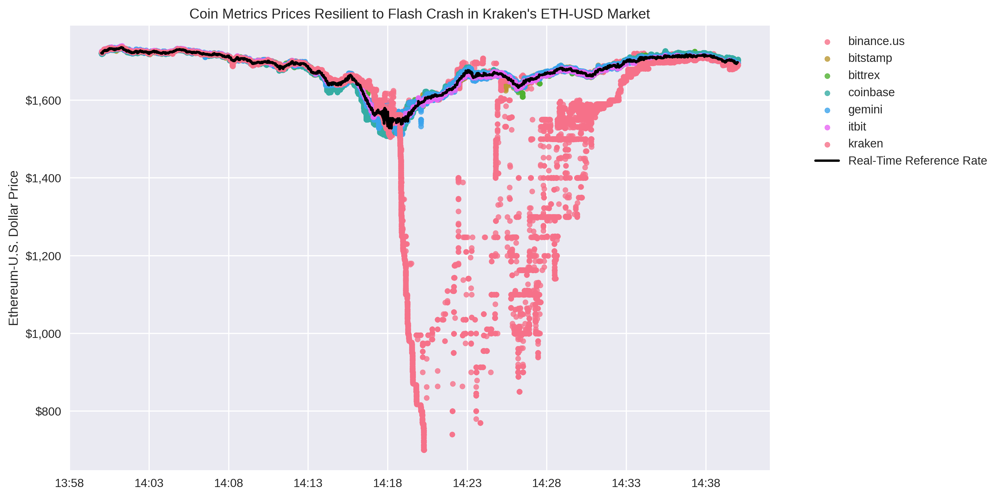

In [47]:
# Create flash crash visualization
# Filter to show data from 1 hour after start time
# Convert start_time to timezone-aware datetime to match API data
start_time_dt = pd.to_datetime(start_time, utc=True)
filtered_trades = trades_data[trades_data['time'] >= start_time_dt + timedelta(hours=1)]

fig, ax = plt.subplots(figsize=(12, 6))

# Plot trades by exchange
for exchange in filtered_trades['exchange'].unique():
    exchange_data = filtered_trades[filtered_trades['exchange'] == exchange]
    ax.scatter(exchange_data['time'], exchange_data['price'],
              s=20, alpha=0.8, label=exchange)

# Plot reference rate if available
if 'ReferenceRateUSD' in filtered_trades.columns:
      ax.plot(filtered_trades['time'], filtered_trades['ReferenceRateUSD'],
                color='black', linewidth=2, label='Real-Time Reference Rate')

# Format x-axis to show only HH:MM
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=5))  # Show every hour
ax.set_ylabel('Ethereum-U.S. Dollar Price')
ax.set_title('Coin Metrics Prices Resilient to Flash Crash in Kraken\'s ETH-USD Market')
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Format y-axis as currency
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x:,.0f}'))

plt.tight_layout()
plt.show()

Our Real-Time Reference Rate for Ethereum, shown above in black, was robust to the Kraken flash crash in part due to our reliance on a volume-weighted median methodology. Our reliance on inverse price variance weighting also contributed. A methodology that utilizes a volume-weighted average would be adversely affected. This example represents a recent flash crash in the second biggest cryptoasset and on the second or third biggest exchange by market share in U.S. dollar trading. These pricing anomalies are common and occur even more frequently in less liquid assets and less liquid exchanges. Volume-weighted medians are more robust to these events and a volume-weighted median price has the added benefit of remaining closer to the price where the majority of trading takes place.

Our decision to use a volume-weighted median in our pricing methodologies is consistent with the decisions made by the following financial benchmark administrators:

1. Crypto Facilities administers the [CME CF Reference Rates](https://www.cmegroup.com/trading/cryptocurrency-indices/cf-bitcoin-reference-rate.html) which are used as the settlement price for CME Bitcoin and Ethereum futures. The methodology uses a volume-weighted median of a set of time partitions.

2. The New York Fed which administers for the [Effective Federal Funds Rate (EFFR), the Overnight Bank Funding Rate (OBFR), the Secured Overnight Financing Rate (SOFR)](https://www.newyorkfed.org/markets/reference-rates), and several other rates. The New York Fed uses a volume-weighted median methodology as discussed in this section.

3. Bitwise Asset Management which offers the [Bitwise 10 Crypto Index Fund, Bitwise DeFi Crypto Index Fund, Bitwise Bitcoin Fund](https://www.bitwiseinvestments.com/), and several others. In connection with a [filing with the SEC seeking approval to launch a Bitcoin ETF](https://www.sec.gov/comments/sr-nysearca-2019-01/srnysearca201901-5164833-183434.pdf), Bitwise proposed a volume-weighted median pricing methodology citing the ability of the weighted median to systematically exclude outlier prices and protect against attempts to manipulate the price.

In [11]:
# Demonstrate volume-weighted average methodology impact
def calculate_volume_weighted_average(trades_data, time_seconds):
    """
    Calculate volume-weighted average reference rate for comparison
    """
    vwap_results = []

    for timestamp in time_seconds:
        # Ensure timestamp is timezone-aware to match trades data
        if timestamp.tz is None:
            timestamp = pd.to_datetime(timestamp, utc=True)

        # Get trailing hour volume weights
        trailing_hour = trades_data[
            (trades_data['time'] >= timestamp - timedelta(hours=1)) &
            (trades_data['time'] < timestamp)
        ]

        if trailing_hour.empty:
            continue

        # Calculate volume weights by market
        volume_weights = trailing_hour.groupby('market')['amount'].sum()
        volume_weights = volume_weights / volume_weights.sum()

        # Get most recent trades before timestamp
        recent_trades = trades_data[trades_data['time'] < timestamp]
        if recent_trades.empty:
            continue

        latest_by_market = recent_trades.groupby('market').tail(1)

        # Calculate VWAP
        vwap = 0
        total_weight = 0

        for _, trade in latest_by_market.iterrows():
            if trade['market'] in volume_weights.index:
                weight = volume_weights[trade['market']]
                vwap += trade['price'] * weight
                total_weight += weight

        if total_weight > 0:
            vwap_results.append({
                'time': timestamp,
                'reference_rate_vwap': vwap / total_weight
            })

    return pd.DataFrame(vwap_results)

if not trades_data.empty:
    # Generate time series for VWAP calculation
    start_calc = pd.to_datetime(start_time, utc=True) + timedelta(hours=1)
    end_calc = pd.to_datetime(end_time, utc=True)
    time_seconds = pd.date_range(start_calc, end_calc, freq='S', tz='UTC')

    print("Calculating volume-weighted average prices...")
    vwap_data = calculate_volume_weighted_average(trades_data, time_seconds)

    if not vwap_data.empty:
        # Merge VWAP data with trades
        trades_with_vwap = trades_data.merge(
            vwap_data.rename(columns={'time': 'time_second'}),
            on='time_second',
            how='left'
        )
        trades_with_vwap['reference_rate_vwap'] = trades_with_vwap['reference_rate_vwap'].ffill()

        print(f"Generated {len(vwap_data)} VWAP data points")
    else:
        trades_with_vwap = trades_data
        print("No VWAP data generated")
else:
    trades_with_vwap = pd.DataFrame()
    print("No trades data available for VWAP calculation")

Calculating volume-weighted average prices...
Generated 2401 VWAP data points


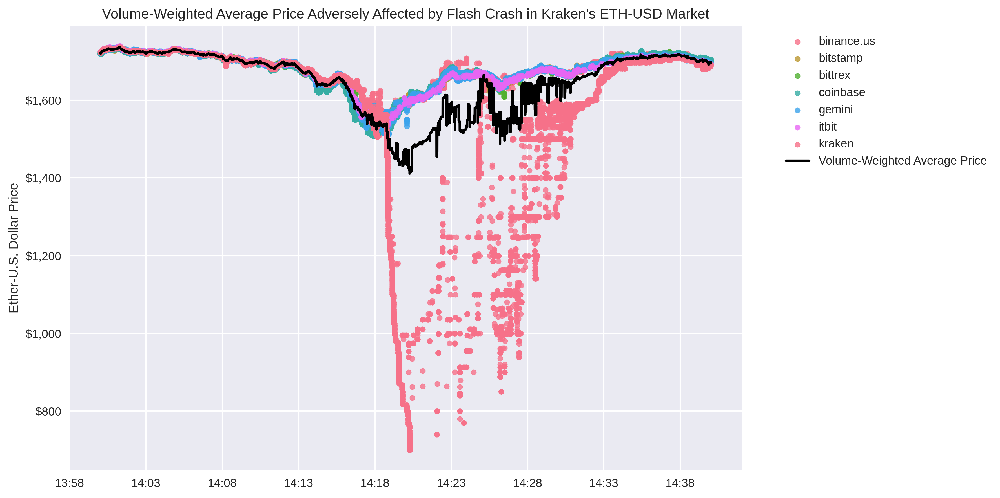

In [49]:
# Create VWAP comparison plot
# Filter to show data from 1 hour after start time
# Convert start_time to timezone-aware datetime to match API data
start_time_dt = pd.to_datetime(start_time, utc=True)
filtered_trades_vwap = trades_with_vwap[trades_with_vwap['time'] > start_time_dt + timedelta(hours=1)]

fig, ax = plt.subplots(figsize=(12, 6))

# Plot trades by exchange
for exchange in filtered_trades_vwap['exchange'].unique():
    exchange_data = filtered_trades_vwap[filtered_trades_vwap['exchange'] == exchange]
    ax.scatter(exchange_data['time'], exchange_data['price'],
              s=20, alpha=0.8, label=exchange)

# Extract VWAP data, remove NaNs, and sort by time
vwap_data = filtered_trades_vwap[['time', 'reference_rate_vwap']].dropna()
vwap_data = vwap_data.sort_values('time')  # KEY FIX: Sort chronologically

# Plot the cleaned VWAP data
ax.plot(vwap_data['time'], vwap_data['reference_rate_vwap'],
        color='black', linewidth=2, label='Volume-Weighted Average Price')

# Format x-axis to show only HH:MM
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
ax.xaxis.set_major_locator(mdates.MinuteLocator(interval=5))

ax.set_ylabel('Ether-U.S. Dollar Price')
ax.set_title('Volume-Weighted Average Price Adversely Affected by Flash Crash in Kraken\'s ETH-USD Market')
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Format y-axis as currency
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x:,.0f}'))

plt.tight_layout()
plt.show()

Methodologies utilizing volume-weighted average prices are adversely affected by outliers and can lead to improper settlement values and liquidations.

# Evaluation of Coin Metrics Prices During Periods of Market Stress

In this section, we evaluate the performance of the Coin Metrics Real-Time Reference Rates and Hourly Reference Rates during periods of market stress. Periods of market stress can include instances of significant price volatility, large spreads between major exchanges, or when multiple exchanges experience website or API instability. In the following plots, we show the trades from our constituent markets in colour and our reference rates in black. The first plot in each section is a plot of our Real-Time Reference Rates. And the second plot is of our Hourly Reference Rates.

## Bitstamp Crash on May 17, 2019

On May 17, 2019, Bitstamp experienced a crash that nearly exhausted the bid side of its order book. Trading was extremely erratic following the crash as the order book slowly returned to normal as trades were matched across a very wide bid ask spread. Bitstamp is the third largest exchange in the BTC-USD pair, however, Coin Metrics' reference rate adhered to where the majority of trading occurred on major markets and was unaffected by this incident.

Fetching trades data for Bitcoin case study...


Exporting to dataframe type: 100%|██████████| 7/7 [00:18<00:00,  2.68s/it]


Fetching hourly reference rate for Bitcoin case study...


Exporting to dataframe type: 100%|██████████| 24/24 [00:01<00:00, 15.22it/s]


Fetching second-by-second reference rate for Bitcoin case study...


Exporting to dataframe type: 100%|██████████| 144/144 [00:07<00:00, 18.71it/s]


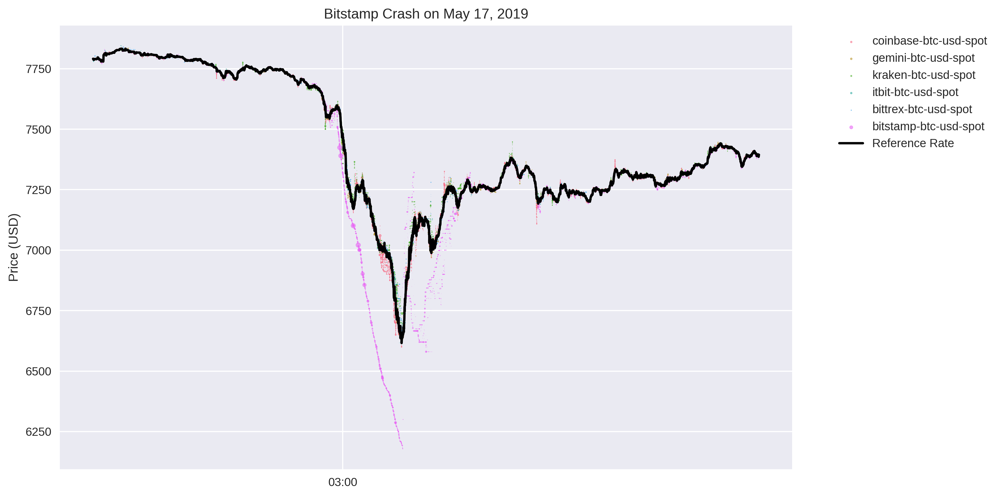

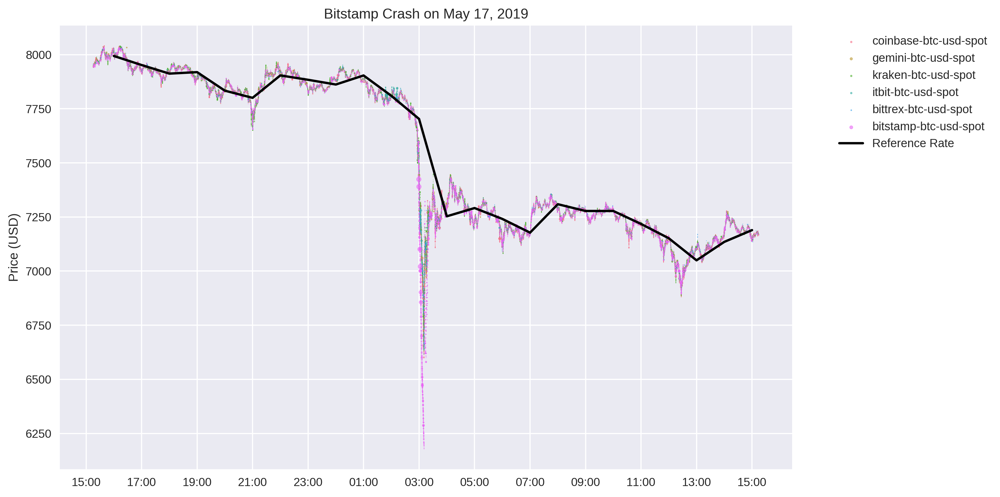

In [50]:
# Generate Bitstamp crash case study
plots_bitstamp = generate_case_study_plots(
    event_time="2019-05-17 03:15:00",
    asset="btc",
    title="Bitstamp Crash",
    window_1s=1,
    window_1h=12
)

## COVID-19 Crash on March 13, 2020

On March 13, 2020, a large liquidation-fueled flash crash occurred in Bitcoin as it sold off simultaneously with other risky assets in response to the onset of the COVID-19 pandemic. A subsequent recovery was observed with significant volatility and large spreads between major exchanges. Coin Metrics' reference rates adhered to where the majority of trading took place and was unaffected by outliers and persistent spreads from certain constituent markets.

Fetching trades data for Bitcoin case study...


Exporting to dataframe type: 100%|██████████| 7/7 [00:48<00:00,  6.95s/it]


Fetching hourly reference rate for Bitcoin case study...


Exporting to dataframe type: 100%|██████████| 24/24 [00:01<00:00, 17.11it/s]


Fetching second-by-second reference rate for Bitcoin case study...


Exporting to dataframe type: 100%|██████████| 144/144 [00:07<00:00, 19.89it/s]


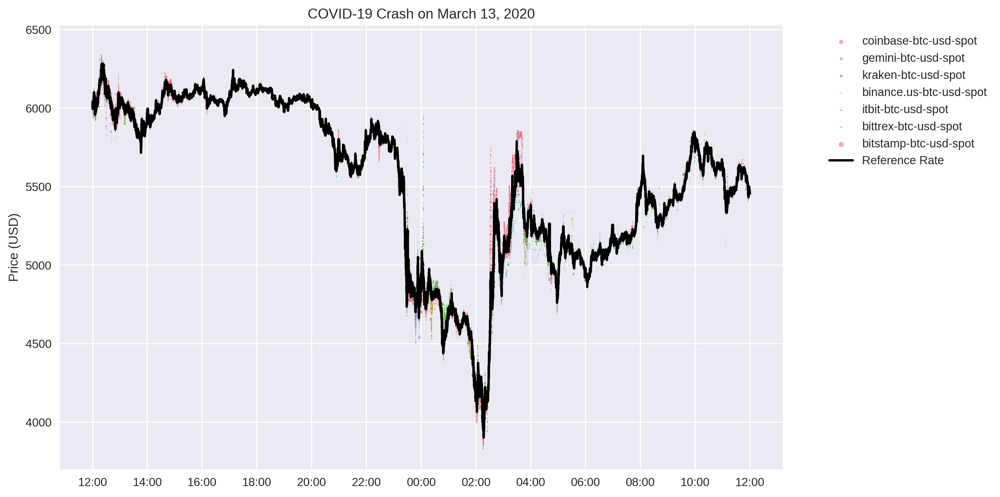

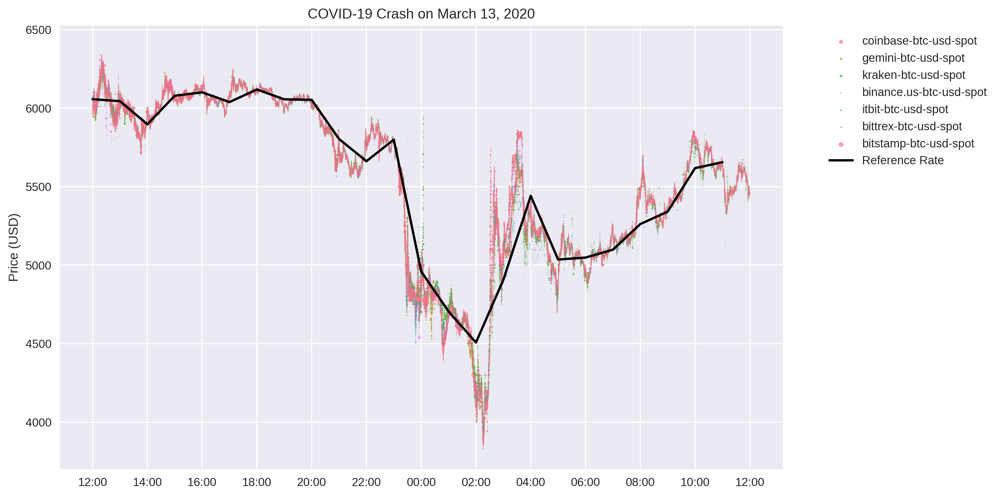

In [51]:
# Generate COVID-19 crash case study
plots_covid = generate_case_study_plots(
    event_time="2020-03-13 00:00:00",
    asset="btc",
    title="COVID-19 Crash",
    window_1s=12,
    window_1h=12
)


## Bitstamp Flash Crash on July 10, 2020

On July 10, 2020, Bitstamp experienced a slight flash crash that caused its BTC-USD price to differ from other major markets by a few percent. Coin Metrics' reference rates were unaffected by during this incident.

Fetching data for Bitcoin case study...


Exporting to dataframe type: 100%|██████████| 144/144 [00:08<00:00, 17.34it/s]


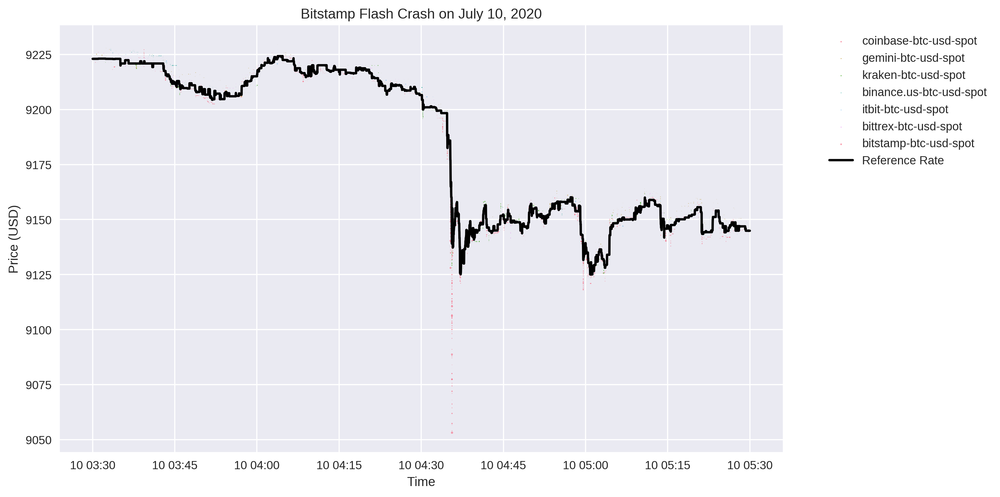

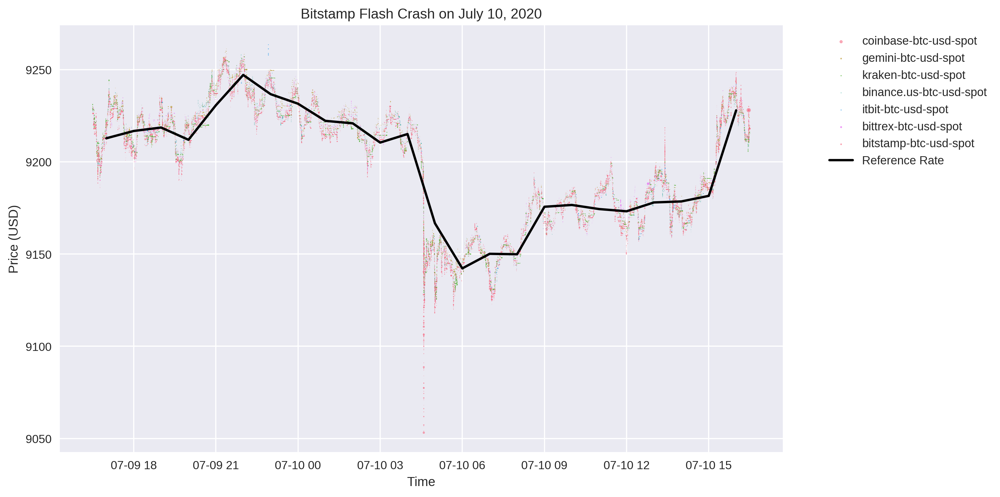

In [27]:
# Generate Bitstamp flash crash case study
plots_bitstamp_flash = generate_case_study_plots(
    event_time="2020-07-10 04:30:00",
    asset="btc",
    title="Bitstamp Flash Crash",
    window_1s=1,
    window_1h=12
)


## Kraken Anomalies on February 22, 2021

On February 22, 2021, Kraken experienced a significant number of anomalous trades as its liquidation engine forcibly closed positions of traders with margin positions. The price on Kraken fell roughly 22% to below $45,000 and trades were exceptionally volatile as the forced liquidations ended since these trades had exhausted nearly the entire bid side of the order book. It took some time before the order book state returned to normal. Kraken is the second largest exchange by market share in the BTC-USD trading pair. Coin Metrics' reference rates were unaffected by during this incident.

Fetching data for Bitcoin case study...


Exporting to dataframe type: 100%|██████████| 144/144 [00:07<00:00, 19.83it/s]


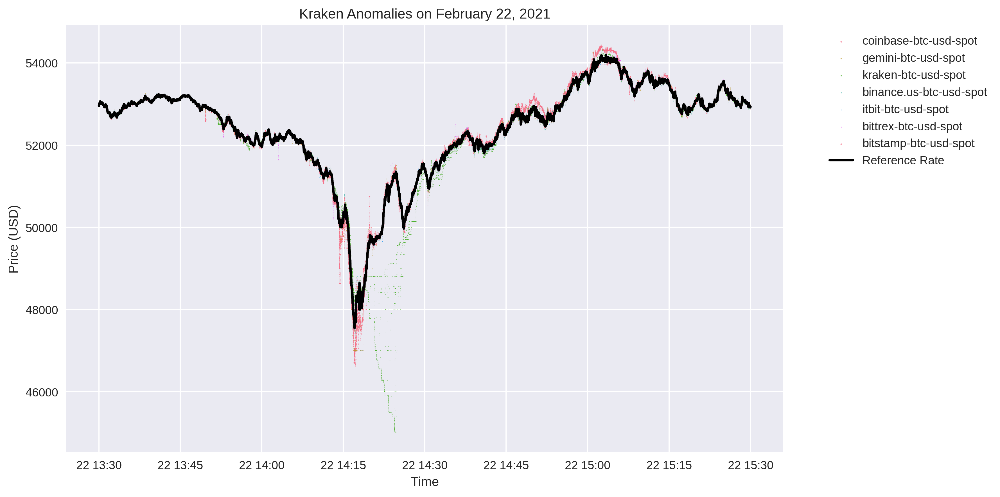

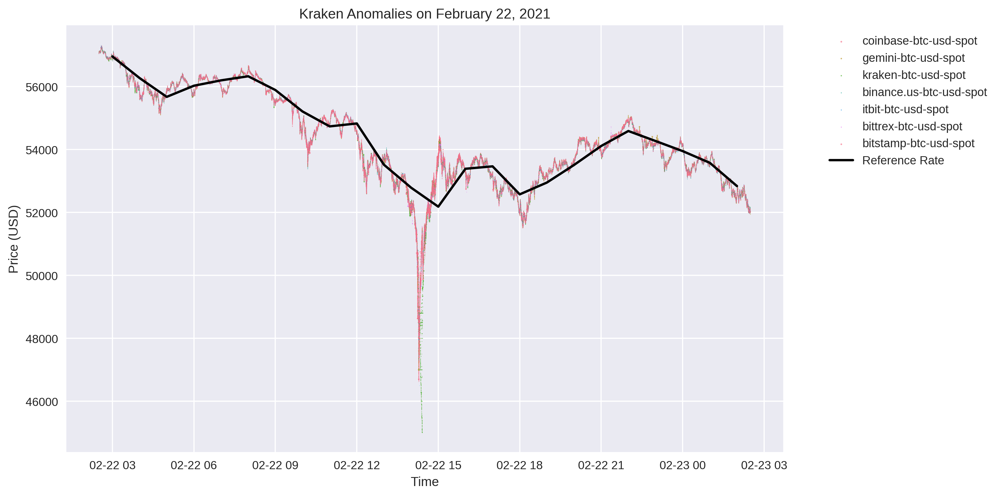

In [28]:
# Generate Kraken anomalies case study for BTC
plots_kraken_btc = generate_case_study_plots(
    event_time="2021-02-22 14:30:00",
    asset="btc",
    title="Kraken Anomalies",
    window_1s=1,
    window_1h=12
)

Fetching data for Ethereum case study...


Exporting to dataframe type: 100%|██████████| 144/144 [00:07<00:00, 19.37it/s]


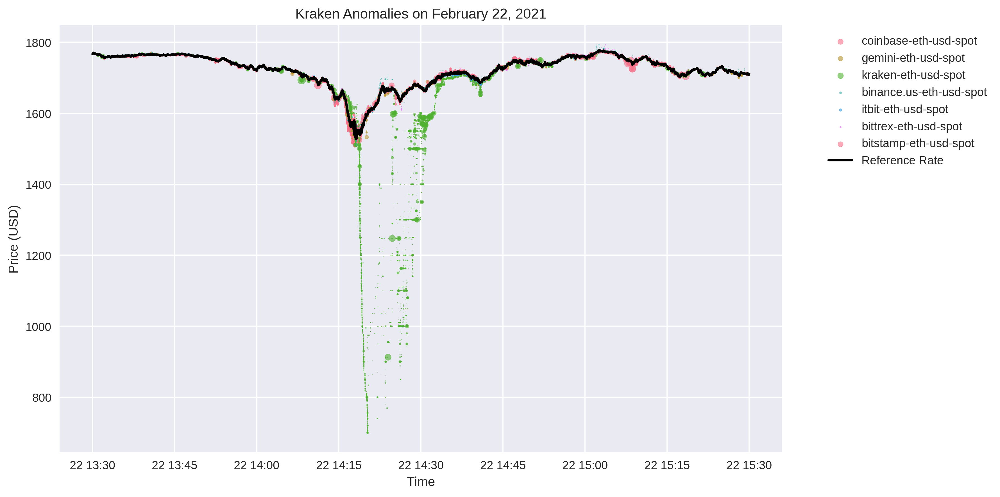

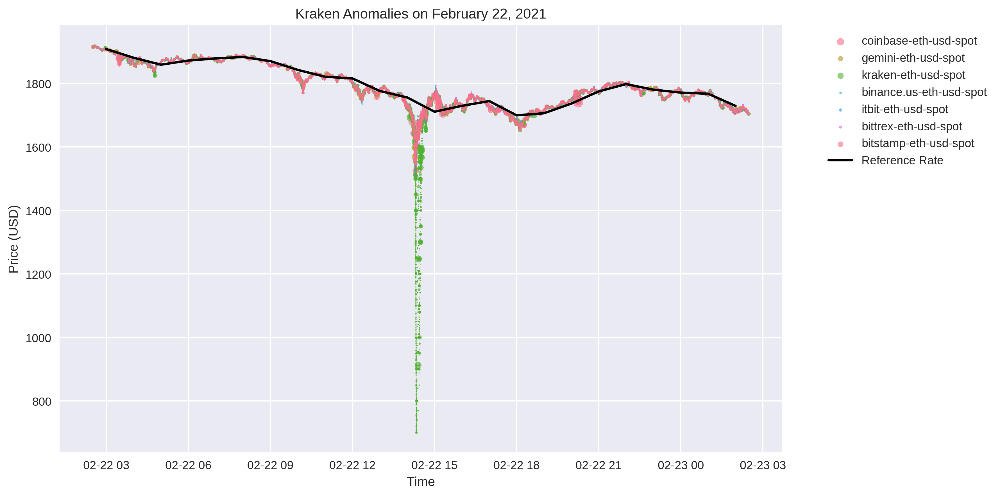

In [29]:
plots_kraken_eth = generate_case_study_plots(
    event_time="2021-02-22 14:30:00",
    asset="eth",
    title="Kraken Anomalies",
    window_1s=1,
    window_1h=12
)

## Large Coinbase Order on April 22, 2021

On April 22, 2021, someone placed a large trade on the Coinbase BTC-USD market. The large sized sell order caused price slippage, which resulted in the price of BTC dropping to below $51,400. Our reference rate represented the global price of BTC, as shown by its alignment with other exchanges.

Fetching data for Bitcoin case study...


Exporting to dataframe type: 100%|██████████| 144/144 [00:07<00:00, 18.60it/s]


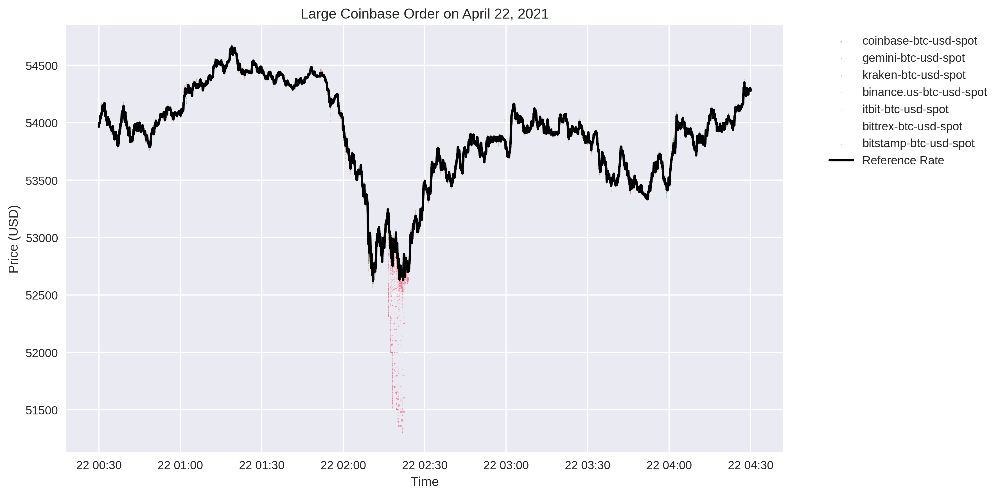

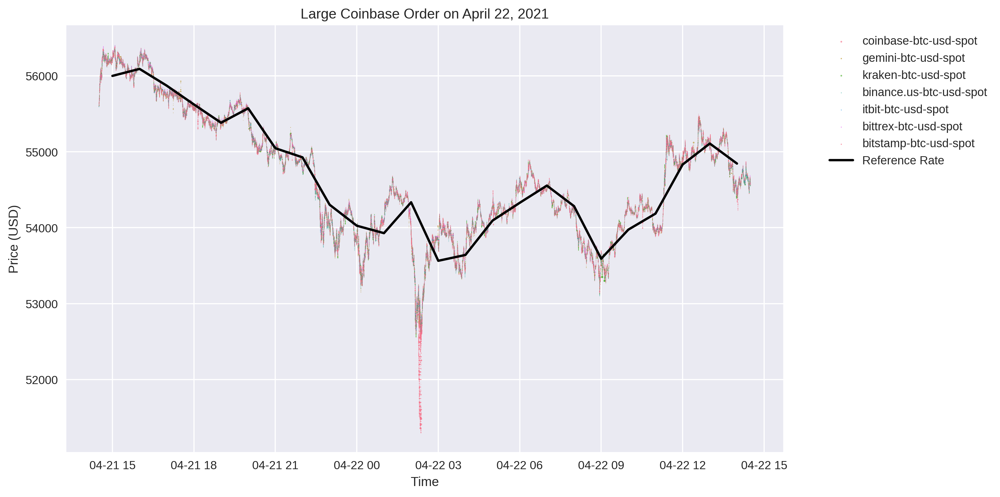

In [30]:
# Generate large Coinbase order case study
plots_coinbase = generate_case_study_plots(
    event_time="2021-04-22 02:30:00",
    asset="btc",
    title="Large Coinbase Order",
    window_1s=2,
    window_1h=12
)

## China and Regulatory-Led on May 19, 2021

On May 19, 2021, Bitcoin dropped by nearly 30 percent in response to negative regulatory developments in the United States and China. Of particular importance is that Coinbase traded at a significant premium to other major markets during this time. Coin Metrics' reference rates traded close to where the majority of our constituent markets traded, despite the fact that Coinbase is the largest exchange by market share and consists of roughly 40 percent of the volume traded during this period.

Fetching data for Bitcoin case study...


Exporting to dataframe type: 100%|██████████| 144/144 [00:07<00:00, 18.89it/s]


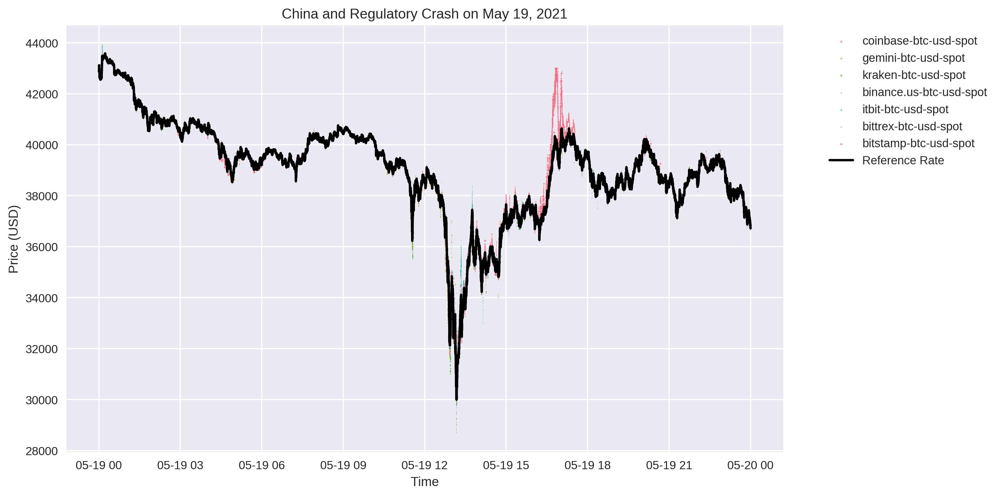

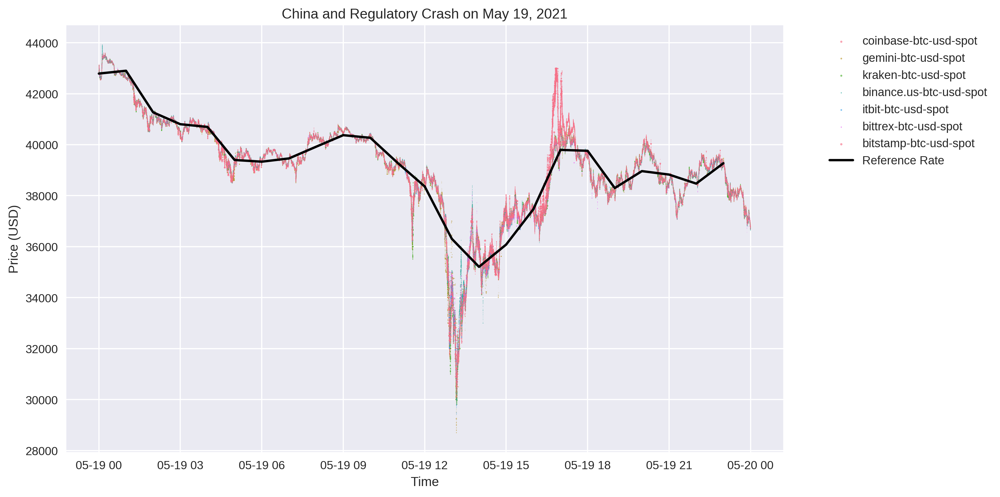

In [31]:
# Generate China regulatory crash case study
plots_china = generate_case_study_plots(
    event_time="2021-05-19 12:00:00",
    asset="btc",
    title="China and Regulatory Crash",
    window_1s=12,
    window_1h=12
)

## Binance.US and itBit Flash Crash on October 21, 2021

On October 21, 2021, Binance.US experienced a roughly 80 percent flash crash in their BTC-USD market. It traded as low as \$8200
 for a few moments due to a trader's malfunctioning algorithm and over 600 bitcoin was traded at prices significantly below the global average. itBit also experienced a flash crash shortly after and traded as low as \$7,600. Coin Metrics' reference rates were unaffected by this incident.

Fetching data for Bitcoin case study...


Exporting to dataframe type: 100%|██████████| 144/144 [00:08<00:00, 17.39it/s]


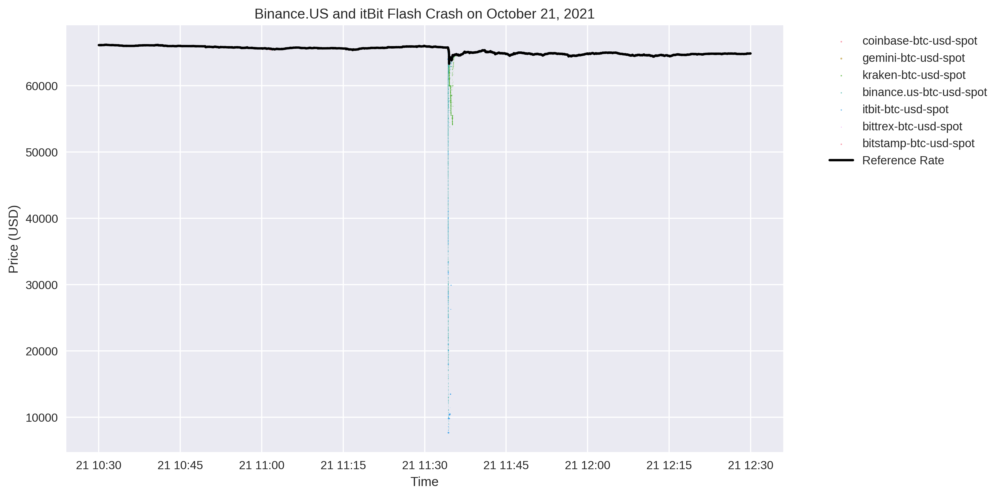

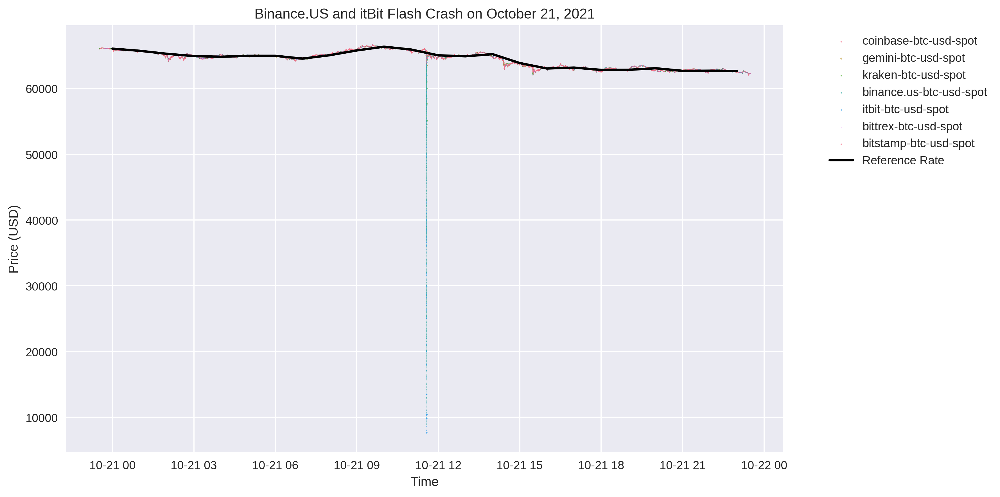

In [32]:
# Generate Binance.US and itBit flash crash case study for BTC
plots_binance_btc = generate_case_study_plots(
    event_time="2021-10-21 11:30:00",
    title="Binance.US and itBit Flash Crash",
    asset="btc",
    window_1s=1,
    window_1h=12
)

Fetching data for Ethereum case study...


Exporting to dataframe type: 100%|██████████| 144/144 [00:07<00:00, 18.62it/s]


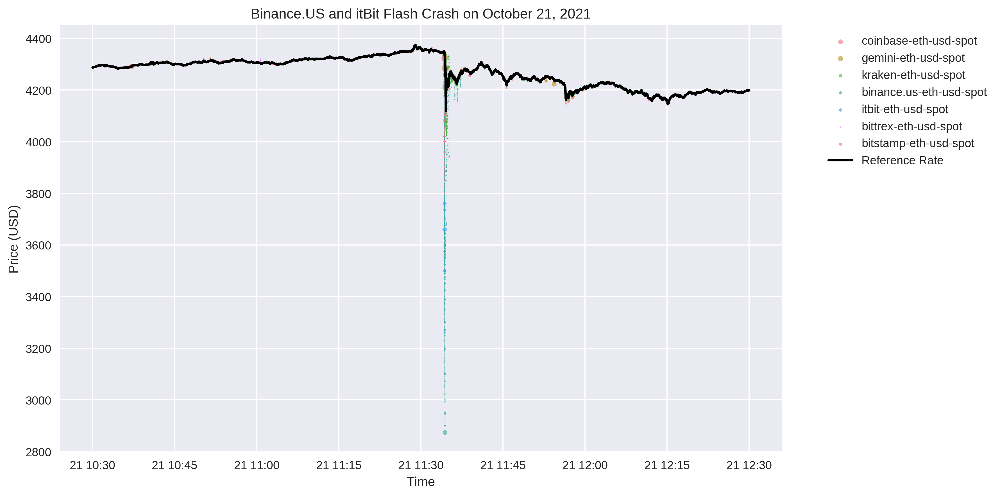

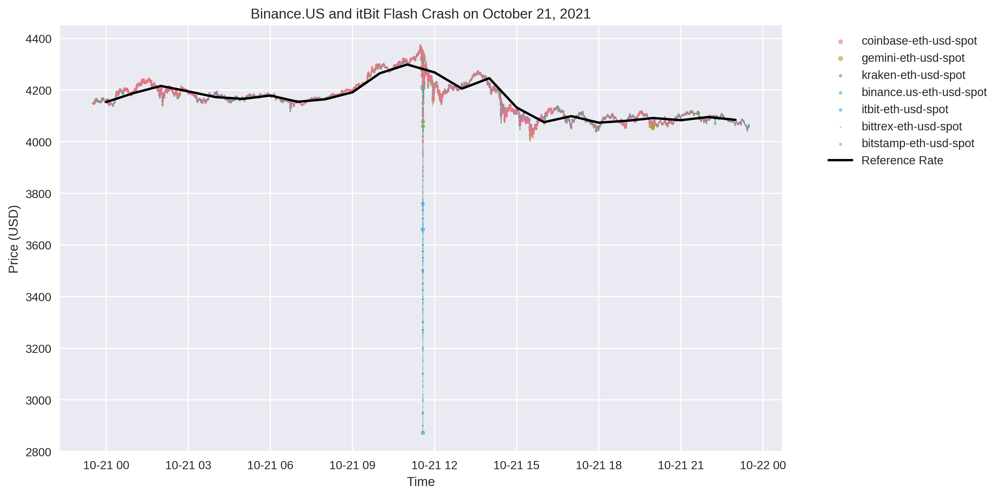

In [33]:
# Generate Binance.US and itBit flash crash case study for ETH
plots_binance_eth = generate_case_study_plots(
    event_time="2021-10-21 11:30:00",
    title="Binance.US and itBit Flash Crash",
    asset="eth",
    window_1s=1,
    window_1h=12
)

## Coinbase Downtime on November 23, 2021

On November 23, 2021, Coinbase experienced major connectivity issues. Trading was paused for at least 1.5 hours. Coin Metrics' reference rates were unaffected by this incident despite the fact that Coinbase's BTC-USD market represents the largest constituent market by volume.

Fetching data for Bitcoin case study...


Exporting to dataframe type: 100%|██████████| 144/144 [00:07<00:00, 18.37it/s]


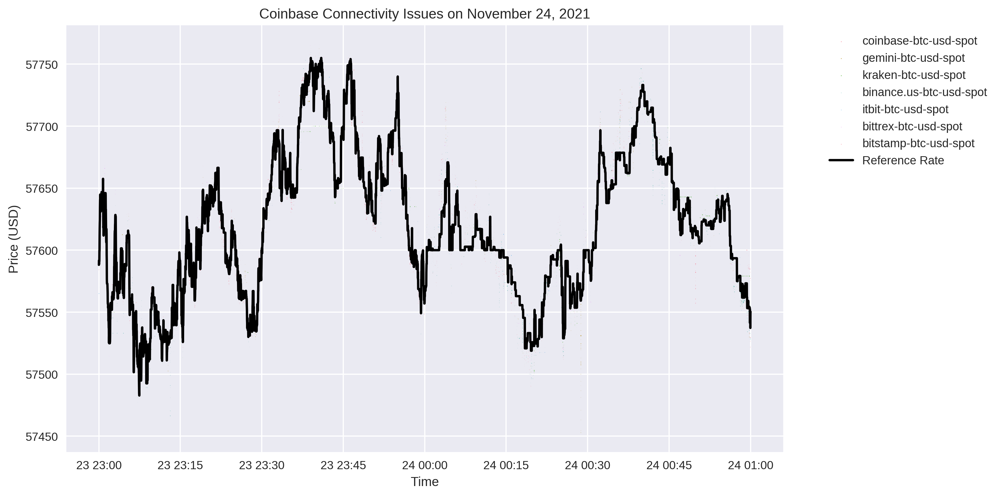

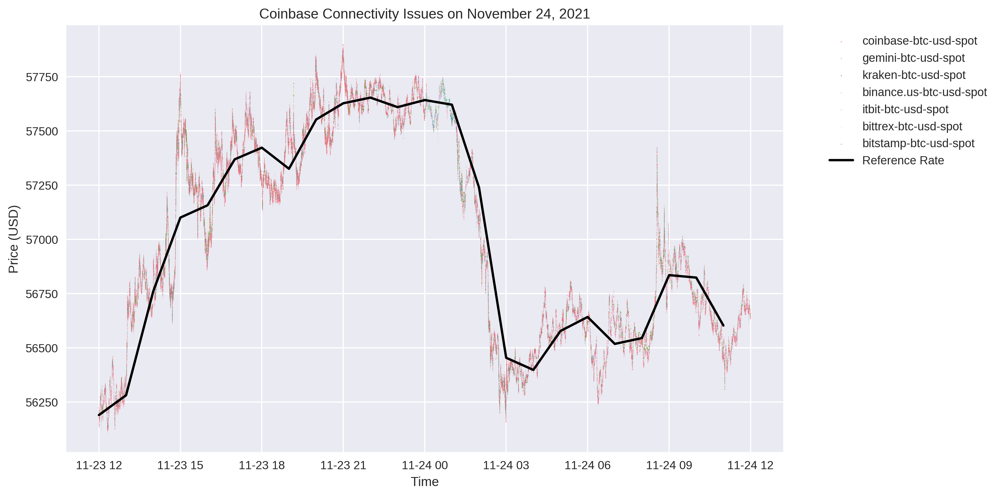

In [37]:
# Generate Coinbase downtime case study
plots_coinbase_down = generate_case_study_plots(
    event_time="2021-11-24 00:00:00",
    title="Coinbase Connectivity Issues",
    asset="btc",
    window_1s=1,
    window_1h=12
)

## Liquidation-Driven Crash on December 4, 2021

On December 4, 2021, during the morning when liquidity is low, we observed a sharp decline in prices that in turn triggered the liquidation of many leveraged positions. Significant spreads were observed across major exchanges with many futures exchanges dipping below spot exchanges. Coin Metrics' reference rates were robust to this incident despite the speed of the move and large spreads between major exchanges.

Fetching data for Bitcoin case study...


Exporting to dataframe type: 100%|██████████| 144/144 [00:07<00:00, 20.04it/s]


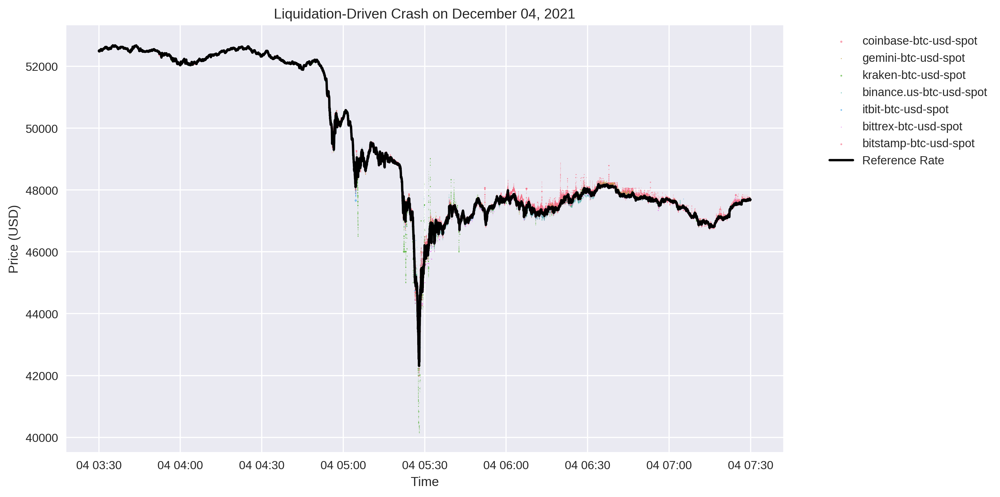

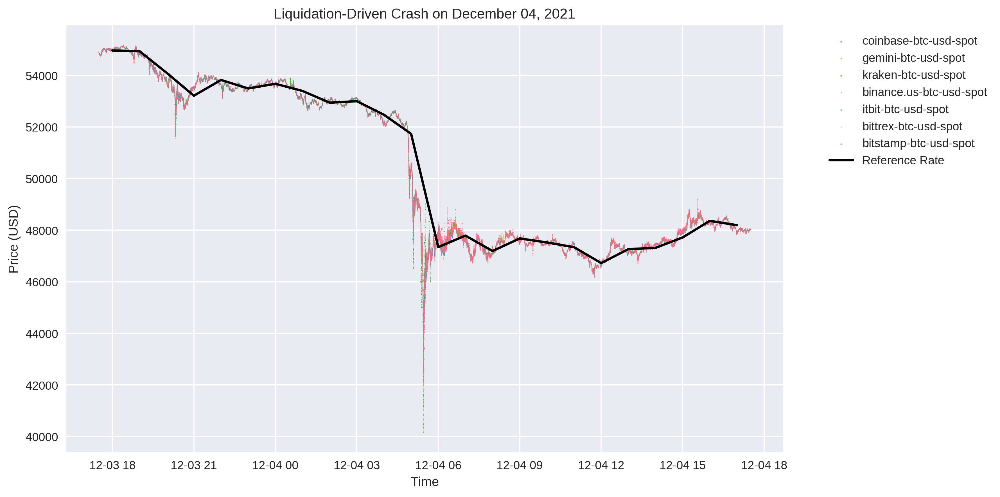

In [38]:
# Generate liquidation-driven crash case study
plots_liquidation = generate_case_study_plots(
    event_time="2021-12-04 05:30:00",
    title="Liquidation-Driven Crash",
    asset="btc",
    window_1s=2,
    window_1h=12
)

## Lending Market Contagion Crash on June 18, 2022

On June 18, 2022, the market experienced sharp declines as the full extent of Three Arrows Capital's impact on several lenders became known.

Fetching trades data for Bitcoin case study...


Exporting to dataframe type: 100%|██████████| 7/7 [01:05<00:00,  9.33s/it]


Fetching hourly reference rate for Bitcoin case study...


Exporting to dataframe type: 100%|██████████| 24/24 [00:01<00:00, 13.33it/s]


Fetching second-by-second reference rate for Bitcoin case study...


Exporting to dataframe type: 100%|██████████| 144/144 [00:07<00:00, 19.88it/s]


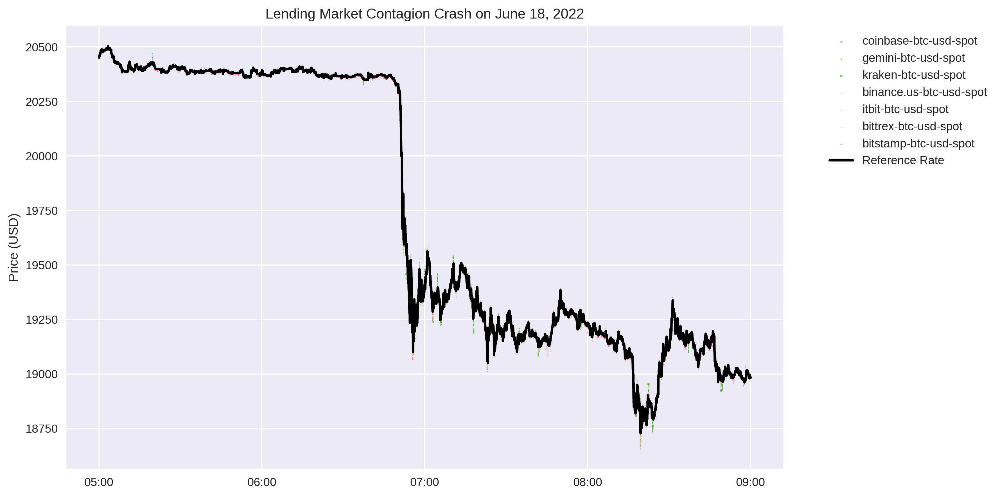

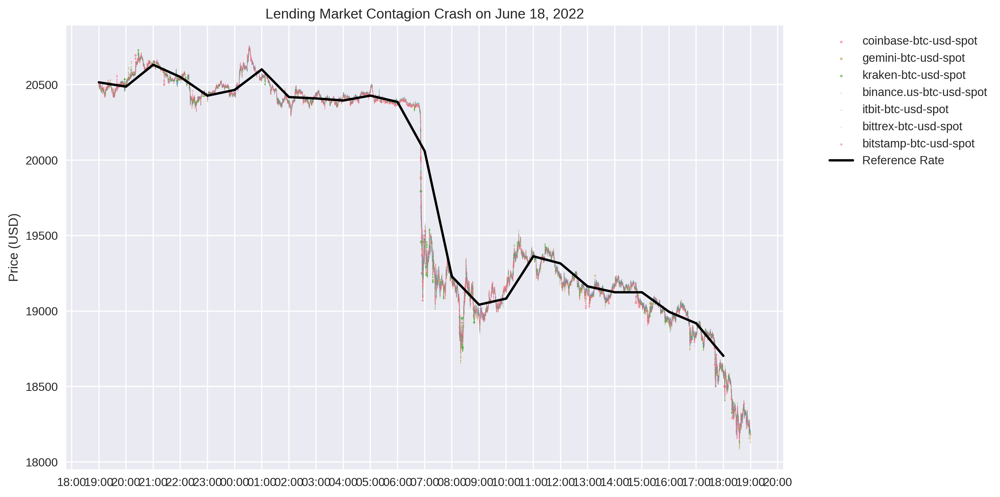

In [43]:
# Generate lending market contagion crash case study
plots_contagion = generate_case_study_plots(
    event_time="2022-06-18 07:00:00",
    title="Lending Market Contagion Crash",
    asset="btc",
    window_1s=2,
    window_1h=12
)

## Summary

This case study demonstrates the robustness of Coin Metrics pricing methodologies during various periods of market stress. The use of volume-weighted median calculations and careful market selection has proven effective in maintaining accurate reference rates even when individual exchanges experience significant disruptions.

Key takeaways:
- Volume-weighted median approaches are more resilient to outliers than volume-weighted averages
- Diversified market selection helps maintain accuracy during single-exchange disruptions
- Transaction-based methodologies provide better auditability and reproducibility than order book approaches
- The methodology performs well across different types of market stress events